## **Problem Statement:**

In the food industry, identifying food items quickly and accurately is essential for applications such as automated inventory management, calorie estimation, restaurant automation, and dietary monitoring. Manual identification is time-consuming, error-prone, and not scalable. Thus, there is a need for an automated, intelligent system that can classify food items from images with high accuracy.

## **Context:**

In the era of digital transformation, automated food detection using computer vision has become increasingly important in various sectors such as hospitality, healthcare, fitness, retail, and food delivery. Accurate identification of food items from images enables intelligent systems to recognize what a person is eating, streamline restaurant operations, or even automate checkout processes in cafeterias.

For example, in a smart cafeteria, cameras can detect and identify food items on a tray without manual input, enabling a frictionless billing experience. In diet and nutrition apps, users can take a picture of their meal, and the app can instantly classify the food and estimate nutritional content. In quality assurance for food production, automated systems can detect if the right type of food is being processed or if items are visually defective.

Such applications demand a robust food classification model capable of identifying food items from images with high accuracy, regardless of variations in presentation, lighting, or camera angles. This project aims to tackle this challenge by leveraging deep learning techniques to train a model that can automatically detect and classify different types of food from a diverse dataset of labeled food images.

## **Data Descriptions:**

The project uses a curated subset of the Food-101 dataset, a widely used benchmark for food classification tasks. This dataset includes:

500 images categorized into

10 distinct food classes (e.g., apple_pie, fried_rice, sushi)

Each class contains a balanced distribution of training and test images, generally split in a 70-30 ratio

Images vary in lighting, background, and angle to mimic real-world food photography conditions

Each image is labeled with the corresponding food class, enabling supervised learning approaches to be applied effectively.


## **Project Objective**

**The primary goal of this project is to:**

Develop a deep learning-based food identification model that can accurately classify food items from images.

**Key objectives include:**

Building a convolutional neural network (CNN) model to classify food images into one of the 10 defined categories

Evaluating model performance using standard metrics such as accuracy, precision, recall and confusion matrix.

Enabling a potential real-time application where the trained model can be integrated into camera-based systems for smart kitchens, restaurant automation, or diet-tracking apps

Ultimately, this solution aims to demonstrate the feasibility of intelligent, camera-driven food recognition systems, contributing toward innovations in food technology and AI-driven lifestyle tools.

## **Step 1: Import the data**

### **Importing Required Libraries**

In [16]:
import os  # File and directory operations
import pandas as pd  # Data handling
import matplotlib.pyplot as plt  # Plotting
import matplotlib.patches as patches  # Drawing shapes on plots
import cv2  # Image processing
import numpy as np


### **Unzipping the Food-101 Dataset**

In [18]:
import zipfile  # Importing the zipfile module to handle ZIP archives
# Importing the os module for interacting with the file system
# Define the path to the ZIP file containing the dataset
zip_path = 'Food_101.zip'

# Define the directory where the ZIP file should be extracted
extract_to = 'food101_data'

# Open the ZIP file in read mode ('r') using a context manager
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    # Extract all contents of the ZIP file to the specified directory
    zip_ref.extractall(extract_to)

# Print confirmation message after extraction is complete
print("Dataset unzipped!")


Dataset unzipped!


### **Verify Directory Structure**

In [19]:

# List all files and directories in the specified path 'extract_to'
# 'extract_to' should be a variable that holds the path where your dataset was extracted
os.listdir(extract_to)


['__MACOSX', 'Food_101']

### **List classes**

In [60]:
# Join the extraction directory with the 'Food_101' folder to get the full path
food101_dir = os.path.join(extract_to, 'Food_101')

# List all files and subdirectories in the 'Food_101' folder
# This will typically include folders like 'images' and files like 'meta'
os.listdir(food101_dir)


['ice_cream',
 'samosa',
 'donuts',
 '.DS_Store',
 'waffles',
 'falafel',
 'ravioli',
 'strawberry_shortcake',
 'spring_rolls',
 'hot_dog',
 'apple_pie',
 'chocolate_cake',
 'tacos',
 'pancakes',
 'pizza',
 'nachos',
 'french_fries',
 'onion_rings']

### **Visualize the data, showing one image per class from 101 classes**

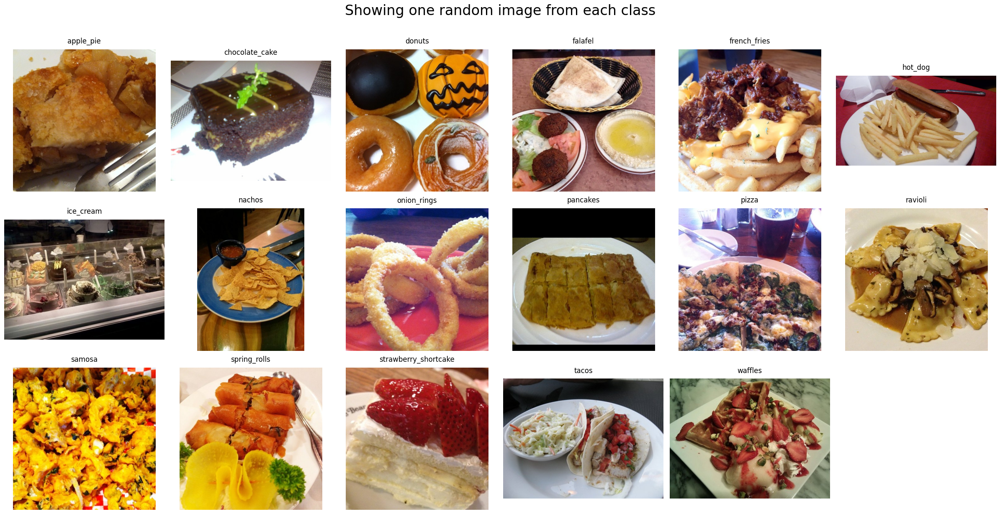

In [71]:
# Visualize the data, showing one image per class from 101 classes
# Path to dataset
data_dir = food101_dir  # Assuming `food101_dir` is already defined
foods_sorted = sorted(os.listdir(data_dir))

# Total number of classes
num_classes = len(foods_sorted)

# Dynamically define grid size
cols = 6
rows = int(np.ceil(num_classes / cols))

# Create subplots
fig, ax = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
fig.suptitle("Showing one random image from each class", y=1.02, fontsize=24)

# Flatten axes for easier iteration (in case rows * cols > num_classes)
ax = ax.flatten()

for food_id, food_name in enumerate(foods_sorted):
    food_images = os.listdir(os.path.join(data_dir, food_name))
    random_img = np.random.choice(food_images)
    img_path = os.path.join(data_dir, food_name, random_img)
    img = plt.imread(img_path)

    ax[food_id].imshow(img)
    ax[food_id].set_title(food_name, pad=10)
    ax[food_id].axis('off')

# Hide any extra axes if there are unused subplots
for i in range(num_classes, len(ax)):
    ax[i].axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.93)  # Leave room for suptitle
plt.show()


## **Step 2: Map training and testing images to its classes.**

In [21]:
from sklearn.model_selection import train_test_split
# Adjust path as needed
base_path = 'food101_data/Food_101'

# Get class names from folder names
class_names = sorted([folder for folder in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, folder))])

data = []

# Collect image path and class label
for label in class_names:
    folder_path = os.path.join(base_path, label)
    for img_file in os.listdir(folder_path):
        if img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
            img_path = os.path.join(folder_path, img_file)
            data.append((img_path, label))

# Create DataFrame
df = pd.DataFrame(data, columns=['image_path', 'label'])

# Split into train/test (80/20)
train_df, test_df = train_test_split(df, test_size=0.2, stratify=df['label'], random_state=42)

print("✅ Mapped images to classes.")
print(f"Train: {len(train_df)} images, Test: {len(test_df)} images")
train_df.head()


✅ Mapped images to classes.
Train: 13004 images, Test: 3252 images


,image_path,label
2230,food101_data/Food_101/donuts/2249805.jpg,donuts
12195,food101_data/Food_101/samosa/1145678.jpg,samosa
13392,food101_data/Food_101/strawberry_shortcake/225...,strawberry_shortcake
13828,food101_data/Food_101/strawberry_shortcake/354...,strawberry_shortcake
10269,food101_data/Food_101/ravioli/788592.jpg,ravioli


## **Step 3: Create annotations for training and testing images.**

[Take any 10 foods(class) of your choice and select any 50 images inside each food and create the annotations manually.
You can use any image annotation tool to get the coordinates.]


## **Step 4: Display images with bounding box you have created manually in the previous step.**

In [46]:
# Path to the CSV file containing image annotations (e.g., bounding boxes, labels)
csv_path = 'Datasetv1/original_images/_annotations.csv'

# Path to the folder where the original images are stored
img_folder = 'Datasetv1/original_images/'

In [47]:
# Load annotations
df = pd.read_csv(csv_path)

In [48]:
df.head()  # Display the first 5 rows of the DataFrame

,filename,width,height,class,xmin,ymin,xmax,ymax
0,2909830_jpg.rf.bb9125215f38f22139f72d04f19e693...,512,512,Apple Pie,210,43,397,259
1,108743_jpg.rf.260978b4f8ae78f4ebb41f48ef501679...,512,384,French Fries,50,3,442,383
2,149278_jpg.rf.86187fd5bd1698133cb7a973c6060449...,512,384,French Fries,33,0,260,167
3,2986199_jpg.rf.ac0b99e71100520e6608ef72b12ee27...,512,512,Apple Pie,28,37,291,233
4,2934928_jpg.rf.c8f427a0d3e7ba9342fe37276fb15ab...,512,512,Apple Pie,9,54,463,465


In [51]:
def show_bboxes(df, n=5, classes_to_show=None):
    # Filter by class if specified
    if classes_to_show:
        #classes_to_show = [cls.lower().replace(" ", "_") for cls in classes_to_show]
        #df['class'] = df['class'].str.lower()
        filtered_df = df[df['class'].isin(classes_to_show)]
        if filtered_df.empty:
            print(f"⚠️ No images found for classes: {classes_to_show}")
            return
    else:
        filtered_df = df

    img_files = filtered_df['filename'].unique()
    total = min(n, len(img_files))

    # Prepare grid layout (e.g., 5 images in 1 row)
    fig, axes = plt.subplots(1, total, figsize=(5 * total, 5))

    # If only one image, axes is not iterable
    if total == 1:
        axes = [axes]

    for idx in range(total):
        img_file = img_files[idx]
        img_path = os.path.join(img_folder, img_file)
        if not os.path.exists(img_path):
            print(f"❌ Image not found: {img_path}")
            continue

        img = cv2.imread(img_path)
        if img is None:
            print(f"⚠️ Unable to read image: {img_file}")
            continue

        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax = axes[idx]
        ax.imshow(img_rgb)

        # Draw all boxes for the current image
        for _, row in filtered_df[filtered_df['filename'] == img_file].iterrows():
            x_min, y_min, x_max, y_max = int(row['xmin']), int(row['ymin']), int(row['xmax']), int(row['ymax'])
            label = row['class']
            rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                     linewidth=2, edgecolor='red', facecolor='none')
            ax.add_patch(rect)
            ax.text(x_min, y_min - 5, label, color='red', fontsize=10, backgroundcolor='white')

        ax.axis('off')
        ax.set_title(f"{img_file}", fontsize=10)

    plt.tight_layout()
    plt.show()


In [52]:
# Print all unique food class names in the dataset
print(df['class'].unique())


['Apple Pie' 'French Fries' 'pancakes' 'tacos']


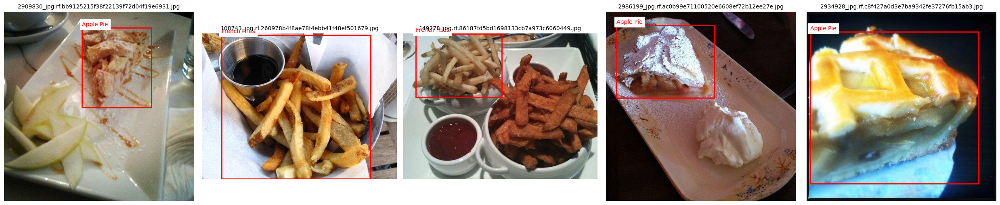

In [53]:
# Show 5 images with boxes only for 'Apple Pie'
show_bboxes(df, n=5)

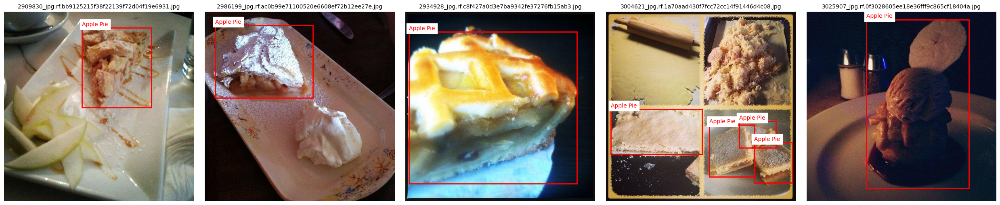

In [54]:
# Show 5 images with boxes only for 'Apple Pie'
show_bboxes(df, n=5, classes_to_show=['Apple Pie'])

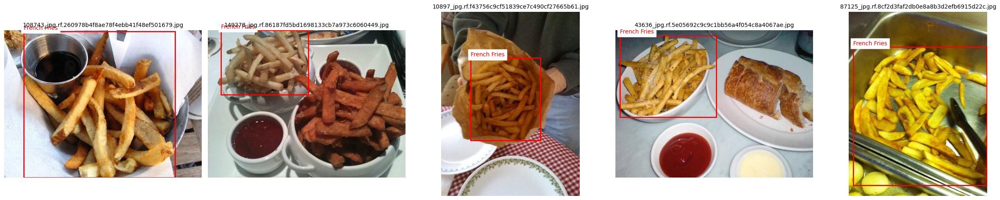

In [55]:
# Show 5 images with boxes only for 'French Fries'
show_bboxes(df, n=5, classes_to_show=['French Fries'])

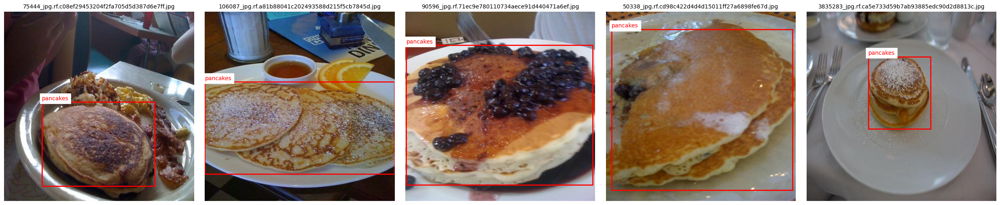

In [56]:
# Show 5 images with boxes only for 'pancakes'
show_bboxes(df, n=5, classes_to_show=['pancakes'])


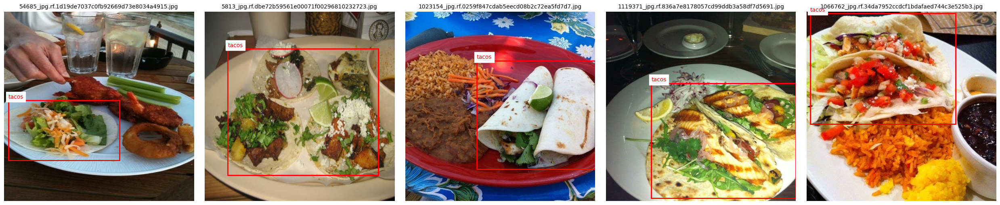

In [57]:
# Show 5 images with boxes only for 'tacos'
show_bboxes(df, n=5, classes_to_show=['tacos'])

## **Step 5: Design, train and test basic CNN models to classify the flood.**

### **Step 5.1: Load & Preprocess Data**


In [72]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import img_to_array

# Load annotations
df = pd.read_csv('Datasetv1/original_images/_annotations.csv')

# We'll use only one row per image since classification doesn’t need boxes
df = df.drop_duplicates(subset=['filename', 'class'])

# Encode class labels
class_names = sorted(df['class'].unique())
class_to_idx = {cls: idx for idx, cls in enumerate(class_names)}
df['label'] = df['class'].map(class_to_idx)

# Load images and labels
img_folder = 'Datasetv1/original_images/'
images, labels = [], []

for _, row in df.iterrows():
    path = os.path.join(img_folder, row['filename'])
    img = cv2.imread(path)
    if img is not None:
        img = cv2.resize(img, (128, 128))  # Resize to fixed size
        img = img_to_array(img) / 255.0
        images.append(img)
        labels.append(row['label'])

X = np.array(images)
y = to_categorical(labels, num_classes=len(class_names))

# Split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)


### Step 5.2: Build a Basic CNN

In [75]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.layers import Input

model = Sequential([
    Input(shape=(128, 128, 3)),  # Explicit input layer
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D((2,2)),
    
    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D((2,2)),

    Conv2D(128, (3,3), activation='relu'),
    MaxPooling2D((2,2)),

    Flatten(),
    Dropout(0.5),
    Dense(128, activation='relu'),
    Dense(len(class_names), activation='softmax')
])
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 28, 28, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │     3,211,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,305,156 (12.61 MB)

 Trainable params: 3,305,156 (12.61 MB)

 Non-trainable params: 0 (0.00 B)

### 5.3: Train the Model

In [80]:
history = model.fit(X_train, y_train, epochs=10, batch_size=16, validation_split=0.2)

Epoch 1/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - accuracy: 1.0000 - loss: 0.0132 - val_accuracy: 0.3824 - val_loss: 4.4607
Epoch 2/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 1.0000 - loss: 0.0058 - val_accuracy: 0.4412 - val_loss: 3.9776
Epoch 3/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 1.0000 - loss: 0.0100 - val_accuracy: 0.2941 - val_loss: 6.1709
Epoch 4/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.9831 - loss: 0.0569 - val_accuracy: 0.3824 - val_loss: 5.5819
Epoch 5/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.9502 - loss: 0.2191 - val_accuracy: 0.2353 - val_loss: 4.0372
Epoch 6/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.9598 - loss: 0.1674 - val_accuracy: 0.4118 - val_loss: 3.8177
Epoch 7/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - accuracy: 0.9935 - loss: 0.0416 - val_accuracy: 0.2353 - val_loss: 5.7474
Epoch 8/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.9691 - loss: 0.0944 - val_accuracy: 0.2647 - val_loss: 5.9537


In [82]:
loss, acc = model.evaluate(X_test, y_test)
print(f"✅ Test Accuracy: {acc*100:.2f}%")


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.3998 - loss: 3.7134
✅ Test Accuracy: 38.10%


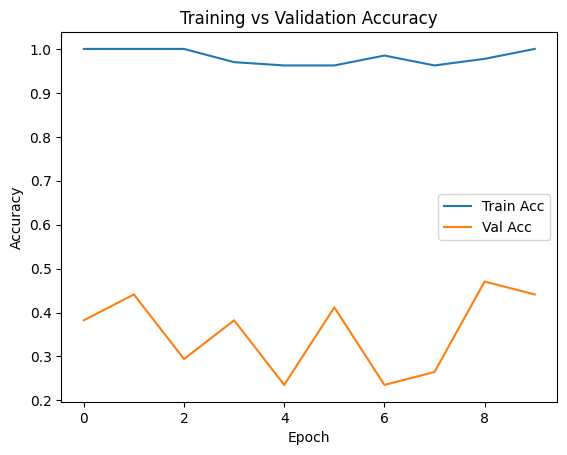

In [83]:
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training vs Validation Accuracy')
plt.legend()
plt.show()
